In [2]:
import pandas as pd
import numpy as np
import pickle
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import VAR, VARMAX
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.statespace.structural import UnobservedComponents
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from statsmodels.tsa.arima.model import ARIMA
import plotly.graph_objs as go
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import datetime
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore")
df1 = pd.read_csv('Grocery_Prices_new_till_feb24.csv')
df2 = pd.read_csv('September_2024.csv')

# Append the two DataFrames
df = pd.concat([df1, df2], ignore_index=True)

# Check the combined DataFrame
df


df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d').apply(lambda x: x.replace(day=1))


all_months = pd.date_range(start='2006-06', end='2024-09', freq='MS')  # Adjust the end date to your requirement

# Function to check for missing months
def check_missing_months(df, all_months):
    food_items = df['Series_title_1'].unique()  # List of unique food items
    missing_data = {}

    for food in food_items:
        # Filter the data for the current food item
        food_data = df[df['Series_title_1'] == food]

        # Extract the months available for this food item
        available_months = food_data['Date'].sort_values().unique()

        # Check for missing months
        missing_months = [month for month in all_months if month not in available_months]

        # Store the food item and the count of missing months if greater than 0
        if missing_months:
            missing_data[food] = len(missing_months)  # Store the count of missing months

    return missing_data

# Check for missing months for each food item
missing_data = check_missing_months(df, all_months)

# Identify food items to remove (those with more than 50 months missing)
items_to_remove = {food for food, months in missing_data.items() if months > 50}

# Remove the food items from the original DataFrame
filtered_df = df[~df['Series_title_1'].isin(items_to_remove)]

# Optional: Print the number of rows before and after filtering
print(f"Original DataFrame rows: {len(df)}")
print(f"Filtered DataFrame rows: {len(filtered_df)}")


df=0
df = filtered_df
# df

# Ensure uniqueness by averaging duplicates (or you can choose another method)
df = df.groupby(['Date', 'Series_title_1'], as_index=False)['Data_value'].mean()

# Pivot the dataset to have food items as columns and dates as index
pivot_df = df.pivot(index='Date', columns='Series_title_1', values='Data_value')
pivot_df

## Filling Null Values

pivot_df = pivot_df.fillna(method='ffill').fillna(method='bfill')
pivot_df

## Check Null and Duplicated Values

# Check for duplicates
print(pivot_df.index.duplicated().sum())

# Check for missing values
print(pivot_df.isnull().sum().sum())

## Splitting Data

# Split the dataset into training and testing sets
# n_obs = int(0.8 * len(pivot_df))
train = pivot_df[:-24]
test = pivot_df[-24:]
# Initialize final outputs
hybrid_forecast_df = pd.DataFrame(index=test.index, columns=pivot_df.columns)
metrics = {}

for column in pivot_df.columns:
    try:
        # === Exponential Smoothing Forecast ===
        exp_model = ExponentialSmoothing(train[column], seasonal='add', seasonal_periods=12)
        exp_fit = exp_model.fit()
        exp_forecast = exp_fit.forecast(steps=len(test))

        # === SARIMA Forecast (with spike handling via log) ===
        train_log = np.log1p(train[column])
        sarima_model = SARIMAX(train_log, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12),
                               enforce_stationarity=False, enforce_invertibility=False)
        sarima_fit = sarima_model.fit(disp=False)
        sarima_forecast_log = sarima_fit.forecast(steps=len(test))
        sarima_forecast = np.expm1(sarima_forecast_log)

        # === MAE Calculation ===
        mae_exp = mean_absolute_error(test[column], exp_forecast)
        mae_sarima = mean_absolute_error(test[column], sarima_forecast)

        # === Threshold-Based Decision ===
        relative_diff = abs(mae_exp - mae_sarima) / min(mae_exp, mae_sarima)

        if relative_diff < 0.05:
            # If difference is within 5%, blend equally
            hybrid_forecast = (exp_forecast + sarima_forecast) / 2
            model_used = "Blended (Exp + SARIMA)"
        else:
            # Otherwise, use the better one
            if mae_sarima < mae_exp:
                hybrid_forecast = sarima_forecast
                model_used = "SARIMA"
            else:
                hybrid_forecast = exp_forecast
                model_used = "Exponential Smoothing"

        # Save forecast and metrics
        hybrid_forecast_df[column] = hybrid_forecast
        metrics[column] = {
            'Model Used': model_used,
            'MAE_Exp': mae_exp,
            'MAE_SARIMA': mae_sarima,
            'Hybrid_MAE': mean_absolute_error(test[column], hybrid_forecast),
            'Hybrid_MSE': mean_squared_error(test[column], hybrid_forecast)
        }

    except Exception as e:
        print(f"Error with {column}: {e}")
        hybrid_forecast_df[column] = np.nan
        metrics[column] = {
            'Model Used': "Error",
            'MAE_Exp': np.nan,
            'MAE_SARIMA': np.nan,
            'Hybrid_MAE': np.nan,
            'Hybrid_MSE': np.nan
        }

# Save forecast to Excel
hybrid_forecast_df.to_excel("Hybrid_Model_ThresholdBased_Forecast.xlsx")
print("✅ Hybrid forecast saved to 'Hybrid_Model_ThresholdBased_Forecast.xlsx'")

# Save metrics
metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
metrics_df.to_excel("Hybrid_Model_ThresholdBased_Metrics.xlsx")
print("✅ Metrics saved to 'Hybrid_Model_ThresholdBased_Metrics.xlsx'")

# Compute and display overall MAE and MSE
from sklearn.metrics import mean_absolute_error, mean_squared_error

actual_flat = test.values.flatten()
predicted_flat = hybrid_forecast_df.values.flatten()
mask = ~np.isnan(actual_flat) & ~np.isnan(predicted_flat)

overall_mae = mean_absolute_error(actual_flat[mask], predicted_flat[mask])
overall_mse = mean_squared_error(actual_flat[mask], predicted_flat[mask])

print(f"\n📊 Overall Hybrid Model Performance (Threshold-Based):")
print(f"MAE: {overall_mae:.4f}")
print(f"MSE: {overall_mse:.4f}")


Original DataFrame rows: 31543
Filtered DataFrame rows: 29030
0
0
✅ Hybrid forecast saved to 'Hybrid_Model_ThresholdBased_Forecast.xlsx'
✅ Metrics saved to 'Hybrid_Model_ThresholdBased_Metrics.xlsx'

📊 Overall Hybrid Model Performance (Threshold-Based):
MAE: 0.6988
MSE: 1.6602


In [3]:
import plotly.graph_objects as go

# Get top food items based on their average price (or modify selection criteria)
top_food_items = pivot_df.mean().index  # Top 10 food items

# Create a Plotly figure
fig = go.Figure()

# Add traces for original data and hybrid forecast for each food item
for column in top_food_items:
    fig.add_trace(go.Scatter(
        x=pivot_df.index, y=pivot_df[column], 
        mode='lines', name=f'Original - {column}', 
        visible=True if column == top_food_items[0] else False
    ))

    fig.add_trace(go.Scatter(
        x=hybrid_forecast_df.index, y=hybrid_forecast_df[column], 
        mode='lines', name=f'Hybrid Forecast - {column}', 
        line=dict(dash='dash'),
        visible=True if column == top_food_items[0] else False
    ))

# Create dropdown buttons for each food item
dropdown_buttons = []

# Add individual product buttons
for column in top_food_items:
    dropdown_buttons.append(
        dict(
            label=column,
            method='update',
            args=[{'visible': [col == column for col in top_food_items for _ in range(2)]},  # Show only the selected product
                  {'title': f'Food Price Forecast for {column}'}]
        )
    )

# Add "All" button
dropdown_buttons.insert(0,
    dict(
        label='All',
        method='update',
        args=[{'visible': [True for _ in range(len(top_food_items) * 2)]},  # Show all products
              {'title': 'Food Price Forecast for All Products'}]
    )
)

# Update layout
fig.update_layout(
    title=f'Food Price Forecast for {top_food_items[0]}',
    xaxis_title='Date',
    yaxis_title='Price',
    template='plotly_white',
    legend=dict(x=0.01, y=0.99, bordercolor='black', borderwidth=1),
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=0.01, xanchor='left',
            y=1.15, yanchor='top'
        )
    ]
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Show the interactive plot
fig.show()


In [32]:
from sklearn.metrics import mean_absolute_error

# Create an empty dict to store MAEs
mae_per_item = {}

for item in hybrid_forecast_df.columns:
    mae = mean_absolute_error(test[item], hybrid_forecast_df[item])
    mae_per_item[item] = mae

# Convert to DataFrame for sorting/ranking
hybrid_errors_df = pd.DataFrame.from_dict(mae_per_item, orient='index', columns=['MAE'])
best_5_items = hybrid_errors_df.sort_values(by='MAE').head(10)
worst_5_items = hybrid_errors_df.sort_values(by='MAE', ascending=False).head(5)

best_5_items
# worst_5_items

,MAE
"Ice block, water based, each",0.047046
"Cookie, takeaway, each",0.050897
"Chewing gum, packet, each",0.056630
"Milk - standard homogenised, 2 litres",0.058718
"Vinegar, 750ml",0.064670
"Bread - white sliced loaf, 600g",0.070545
"Cream, 300ml - Cheapest Available",0.071923
"Pasta sauces, tomato based, 500g",0.082419
"Pineapple, pieces, in juice or syrup, canned, 425g",0.089302
"Spaghetti - canned, 420g",0.095493


In [33]:
# Calculate MAE and MSE for the hybrid model
mae_hybrid = mean_absolute_error(test, hybrid_forecast_df)
mse_hybrid = mean_squared_error(test, hybrid_forecast_df)

print(f"MAE for Hybrid Model: {mae_hybrid}")
print(f"MSE for Hybrid Model: {mse_hybrid}")

MAE for Hybrid Model: 0.6988355321525502
MSE for Hybrid Model: 1.6602134087842326


In [34]:
mae_hybrid

0.6988355321525502

<Figure size 3000x1800 with 0 Axes>

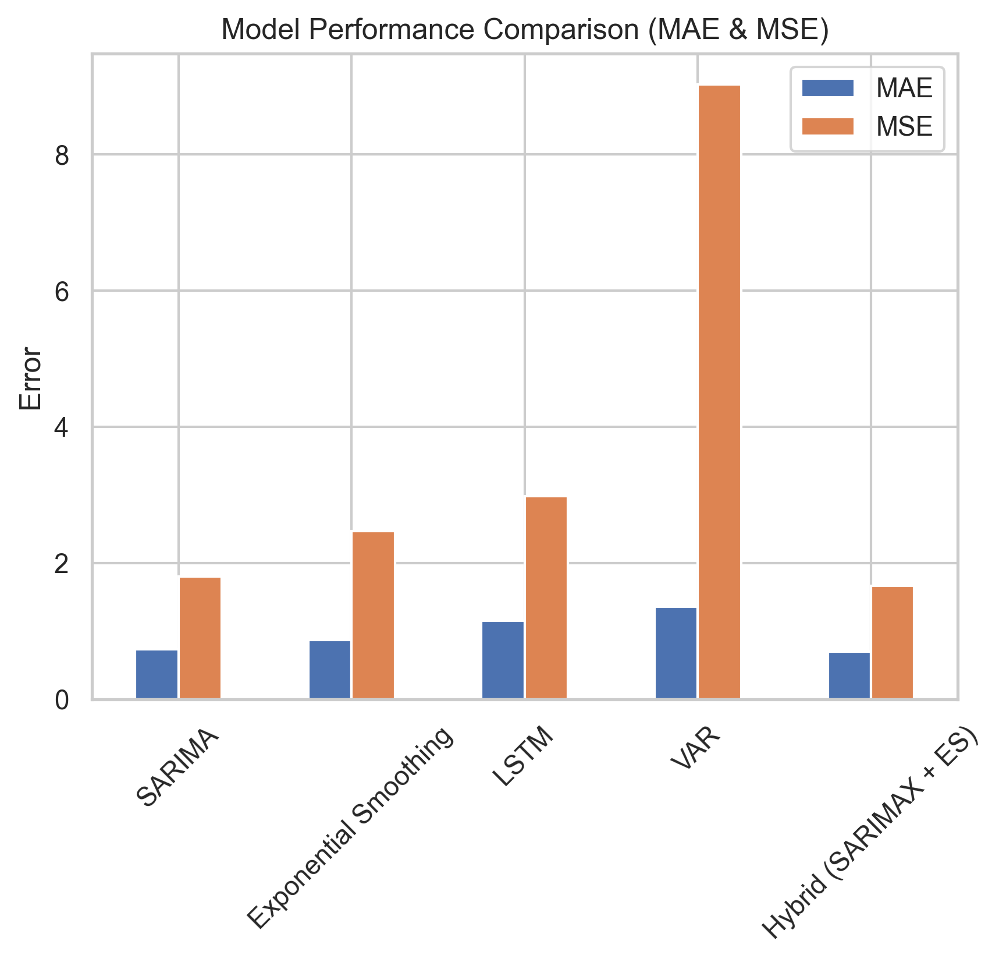

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Existing MAE and MSE values for models
model_errors = pd.DataFrame({
    "MAE": [0.733703, 0.870939, 1.154522, 1.353037],
    "MSE": [1.800294, 2.468444, 2.979777, 9.032677]
}, index=["SARIMA", "Exponential Smoothing", "LSTM", "VAR"])

# Append Hybrid Model's errors
hybrid_errors = pd.DataFrame({
    "MAE": [mae_hybrid],
    "MSE": [mse_hybrid]
}, index=["Hybrid (SARIMAX + ES)"])

# Combine the data
model_errors = pd.concat([model_errors, hybrid_errors])

# Plot comparison
plt.figure(figsize=(10, 6))
model_errors.plot(kind='bar', rot=45)

plt.title("Model Performance Comparison (MAE & MSE)")
plt.ylabel("Error")
plt.xticks(rotation=45)
plt.legend(["MAE", "MSE"])
plt.show()


In [36]:
mae_hybrid

0.6988355321525502

'./model_performance_comparison.png'

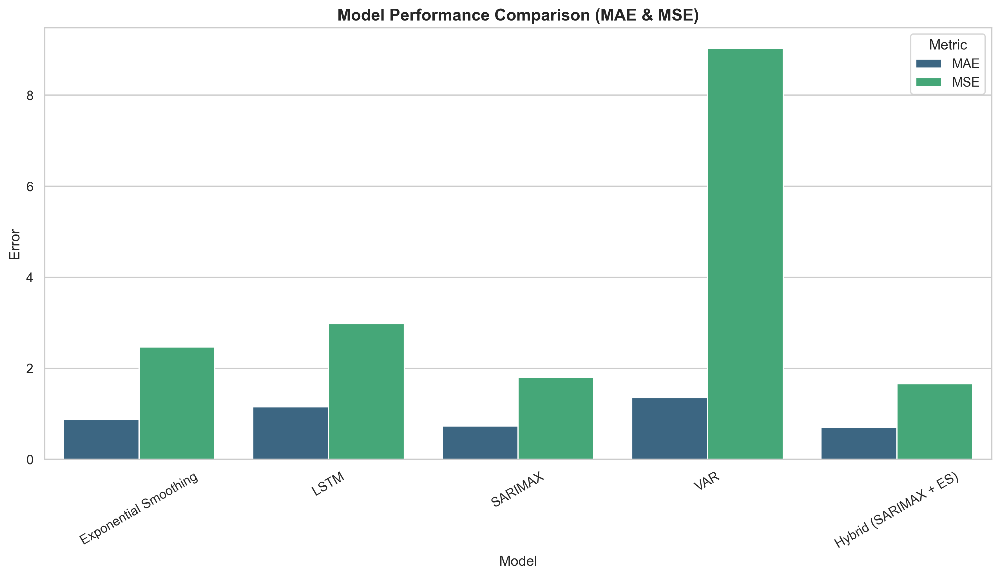

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set high-resolution output
plt.rcParams['figure.dpi'] = 300

# Existing MAE and MSE values for models

model_errors = pd.read_csv("non_hybrid_errors.csv")
model_errors["MAE"] = model_errors["MAE"].astype(float)
model_errors["MSE"] = model_errors["MSE"].astype(float)

# Melt the DataFrame
model_errors_melted = pd.melt(
    model_errors,
    id_vars=["Model"],
    value_vars=["MAE", "MSE"],
    var_name="Metric",
    value_name="Error"
)


# Append hybrid model errors
hybrid_errors = pd.DataFrame({
    "Model": ["Hybrid (SARIMAX + ES)"],
    "MAE": [mae_hybrid],
    "MSE": [mse_hybrid]
})

# Combine the data
model_errors = pd.concat([model_errors, hybrid_errors], ignore_index=True)



# Create a beautiful bar plot using Seaborn
plt.figure(figsize=(12, 7))
# model_errors.reset_index(inplace=True)
# model_errors = model_errors.rename(columns={"index": "Model"})
model_errors_melted = pd.melt(model_errors, id_vars=["Model"], var_name="Metric", value_name="Error")

sns.set(style="whitegrid")
plot = sns.barplot(data=model_errors_melted, x="Model", y="Error", hue="Metric", palette="viridis")
plt.title("Model Performance Comparison (MAE & MSE)", fontsize=14, weight='bold')
plt.xticks(rotation=30)
plt.tight_layout()

# Save the plot locally in high resolution
output_path = "./model_performance_comparison.png"
plt.savefig(output_path, dpi=600)

output_path


In [70]:
model_errors

,Model,MAE,MSE
0,Exponential Smoothing,0.870939,2.468444
1,LSTM,1.154522,2.979777
2,SARIMAX,0.733703,1.800294
3,VAR,1.353037,9.032677
4,Hybrid (SARIMAX + ES),0.698836,1.660213


In [71]:
import plotly.graph_objects as go
import plotly.io as pio

# Get top 10 food items based on average price
top_10_food_items = pivot_df.mean().sort_values(ascending=False).head(5).index

# Create a Plotly figure
fig = go.Figure()

# Add traces for original data and hybrid forecast for each food item
for column in top_10_food_items:
    fig.add_trace(go.Scatter(
        x=pivot_df.index, y=pivot_df[column],
        mode='lines', name=f'Original - {column}'
    ))

    fig.add_trace(go.Scatter(
        x=hybrid_forecast_df.index, y=hybrid_forecast_df[column],
        mode='lines', name=f'Hybrid Forecast - {column}',
        line=dict(dash='dash')
    ))

fig.update_layout(
    title='Hybrid Approach Food Price Forecast for Top 5 Food Items',
    xaxis_title='Date',
    yaxis_title='Price',
    template='plotly_white',
    legend=dict(
        x=1.02,  # Move to the right outside the plot
        y=1,
        xanchor='left',
        yanchor='top',
        font=dict(size=9),
        bordercolor='black',
        borderwidth=1,
        itemsizing='trace'
    ),
    margin=dict(r=180)  # Give extra space on the right for the legend
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)
# Save the figure as a high-quality PNG file
# pio.write_image(fig, 'image.png',scale=6, width=1080, height=1080)

# Show the interactive plot
fig.show()


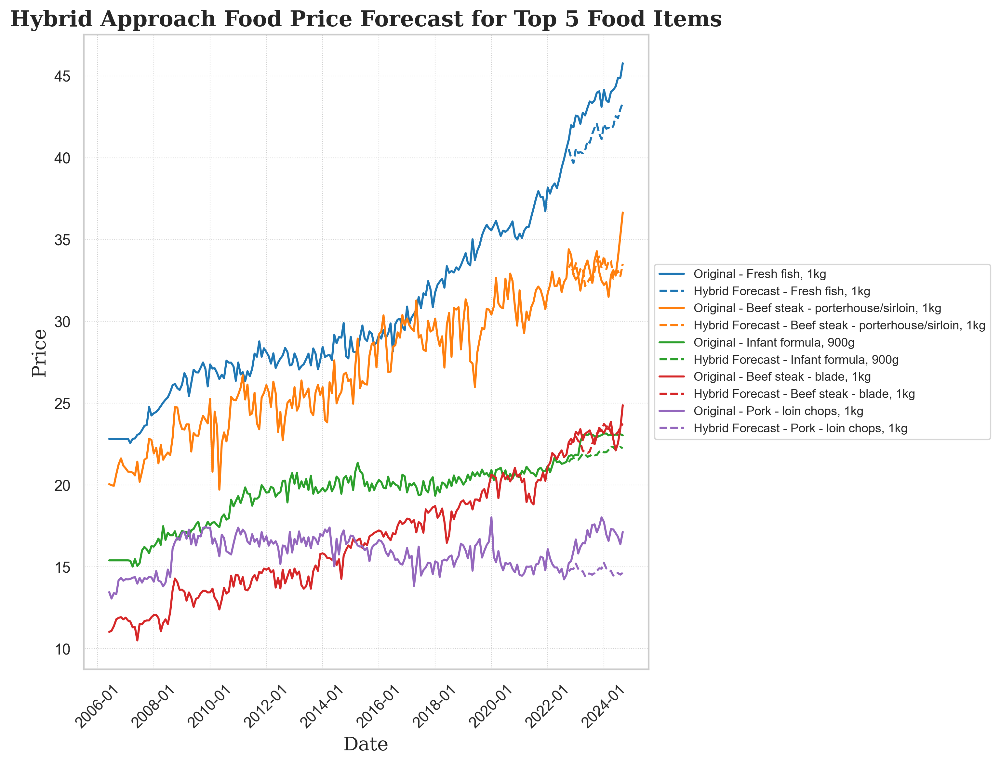

In [72]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 5 food items based on average price
top_5_food_items = pivot_df.mean().sort_values(ascending=False).head(5).index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(top_5_food_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(hybrid_forecast_df.index, hybrid_forecast_df[item], label=f'Hybrid Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('Hybrid Approach Food Price Forecast for Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0.85, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('hybrid_forecast_matplotlib.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


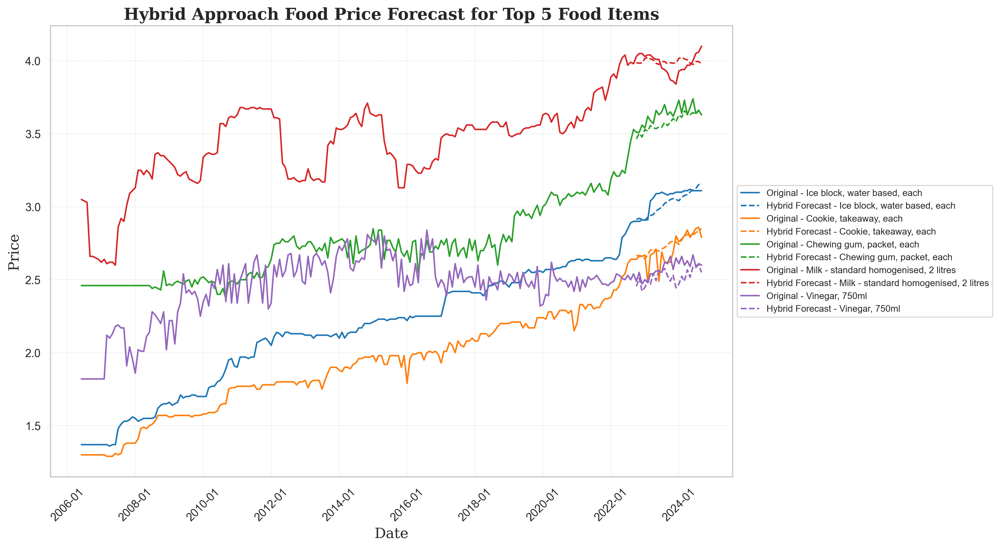

In [73]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
next_top_5_items = best_5_items[:5].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(next_top_5_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(hybrid_forecast_df.index, hybrid_forecast_df[item], label=f'Hybrid Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('Hybrid Approach Food Price Forecast for Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('hybrid_forecast_matplotlib_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


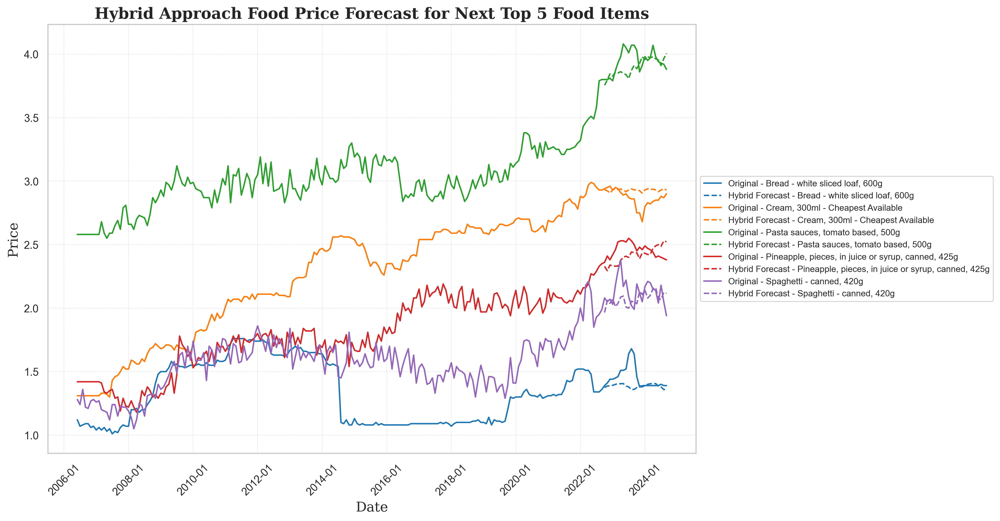

In [74]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Get top 10 food items based on average price


# Split into top 5 and next top 5
# top_5_items = top_10_items[:5]
next_top_5_items = best_5_items[5:].index

# Create a figure and axes
plt.figure(figsize=(12, 8))

# Define line styles and colors
colors = plt.cm.tab10.colors  # Use tab10 for distinct colors

for i, item in enumerate(next_top_5_items):
    # Original data
    plt.plot(pivot_df.index, pivot_df[item], label=f'Original - {item}', color=colors[i % 10])
    
    # Forecast data (dashed)
    plt.plot(hybrid_forecast_df.index, hybrid_forecast_df[item], label=f'Hybrid Forecast - {item}',
             color=colors[i % 10], linestyle='--')

# Formatting
plt.title('Hybrid Approach Food Price Forecast for Next Top 5 Food Items', fontsize=16, fontweight='bold', fontname='serif')
plt.xlabel('Date', fontsize=14, fontname='serif')
plt.ylabel('Price', fontsize=14, fontname='serif')

# Rotate x-axis ticks and format dates
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Grid, legend, layout
plt.grid(True, which='major', linestyle=':', linewidth=0.5)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=True)
plt.tight_layout(rect=[0, 0, 0, 1])  # Leave space for legend

# Save as high-resolution PNG
plt.savefig('hybrid_forecast_matplotlib_next_top_5_performance.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()


In [75]:
model_errors

,Model,MAE,MSE
0,Exponential Smoothing,0.870939,2.468444
1,LSTM,1.154522,2.979777
2,SARIMAX,0.733703,1.800294
3,VAR,1.353037,9.032677
4,Hybrid (SARIMAX + ES),0.698836,1.660213


In [76]:
# Rank each model (lower MAE/MSE = better rank)
model_errors['MAE_Rank'] = model_errors['MAE'].rank()
model_errors['MSE_Rank'] = model_errors['MSE'].rank()

# Calculate average rank
model_errors['Avg_Rank'] = model_errors[['MAE_Rank', 'MSE_Rank']].mean(axis=1)

# Sort by average rank to find best models
best_two_models = model_errors.sort_values(by='Avg_Rank').head(1)

# Display results
print("Top 2 Performing Models:")
print(best_two_models)

Top 2 Performing Models:
                   Model       MAE       MSE  MAE_Rank  MSE_Rank  Avg_Rank
4  Hybrid (SARIMAX + ES)  0.698836  1.660213       1.0       1.0       1.0
